Initial Imports:

In [1]:
from __future__ import absolute_import
from __future__ import print_function
from __future__ import division

%matplotlib inline  

import sys
from datetime import date
import matplotlib
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
import random
import csv

print('Version information')

print('python: {}'.format(sys.version))
print('matplotlib: {}'.format(matplotlib.__version__))
print('numpy: {}'.format(np.__version__))

# Set random seed so output is all same
np.random.seed(1)

Version information
python: 3.6.2 (v3.6.2:5fd33b5926, Jul 16 2017, 20:11:06) 
[GCC 4.2.1 (Apple Inc. build 5666) (dot 3)]
matplotlib: 3.1.0
numpy: 1.16.4


Helper Functions:

In [2]:
def rmse(pred, label): # This is the root mean square error (use the first equation here)
    return np.sqrt(np.mean((pred - label) ** 2))

def normalizeCols(X):
    return (X - np.mean(X, axis=0)[None, :]) / (np.std(X, axis=0)[None, :])

def posterior(pred, y):
    yTrows = np.where(y>0.5)
    yFrows = np.where(y<0.5)
    outArray = np.zeros((2,2)).astype(np.float)
    error = pred - y
    outArray[0,0] = np.sum(pred[yTrows]) / y[yTrows].shape[0]
    outArray[0,1] = 1 - outArray[0,0]
    outArray[1,0] = np.sum(pred[yFrows]) / y[yFrows].shape[0]
    outArray[1,1] = 1 - outArray[1,0]
    return outArray 

In [3]:
# below are some helper functions for plot.
# you don't have to modify them. 

def plot_images(img_list, title_list, figsize=(11, 6)):
    assert len(img_list) == len(title_list)
    fig, axes = plt.subplots(1, len(title_list), figsize=figsize)
    for i, ax in enumerate(axes):
        ax.imshow(img_list[i] / 255.0)
        ax.set_title(title_list[i])
        ax.axis('off')
        
# plot_scatter(Xtrain[0:1], ytrain)
def colorPoint(labelArray):
    N = labelArray.shape[0]
    outArray = np.empty(N, dtype=np.str)
    for i in range(N):
        if labelArray[i] > 0.5:
            outArray[i] = 'b'
        else:
            outArray[i] = 'r'
    return outArray

def plot_scatter(samples, ids):
    colors = np.zeros((len(ids), 3))
    choices = [[0, 0, 1], [0, 1, 0], [1, 0, 0]]
    num_points = []
    for i in range(3):
        num_points.append(np.sum(ids == i))
    maps = np.argsort(num_points)
    for i in range(3):
        colors[np.where(ids == maps[i]), :] = choices[i]
    plt.scatter(samples[:, 0], samples[:, 1], s=1, color=colors)
    plt.axis('equal')

## Parsing the CSV files

The CSV files provide fairly final data. The only computations made are to convert the time data into its finalized format, and to populate binary columns. The binary columns often represent different categories, for example, the incident lane could be active, shoulder, or ramp. Instead of having some arbitrary ordering onto a number line of these points we create three features: "Active", "Shoulder" and "Ramp", Only one of these could have a positive value at a time, this is reflected in the decison tree.

There are two files, one for the northbound traffic on I-475, and one for the southbound.

In [28]:
leftOvers = 1000
# pull data from csv:
reader = csv.reader(open("NB_table_final v2.csv", "rt", encoding='utf-8-sig'), delimiter=",")
x = np.array(list(reader)).astype(np.str)
Nx,Dx = x.shape
northData = np.zeros((Nx,15), dtype=np.float)
#csv parsing:
dL = x[0,4].split("/")
day_0 = date(int(dL[2]),int(dL[0]),int(dL[1]))
for i in range(Nx):
    t = 0.0
    dL = x[i,4].split("/")
    day = date(int(dL[2]),int(dL[0]),int(dL[1]))
    t += 24.0 * (day - day_0).days
    tL = x[i,7].split(":")
    t += float(tL[0]) + float(tL[1]) / 60.0 + float(tL[2]) / (3600.0)
    northData[i,0] = t
    northData[i,1] = t % 24
    northData[i,2] = float(x[i,1])
    northData[i,3] = float(x[i,2])
    northData[i,4] = float(x[i,12])
    northData[i,5] = float(x[i,5])
    if "stopped" in x[i,8]:
        northData[i,6] = 1.0
    elif "slow" in x[i,8]:
        northData[i,7] = 1.0
    elif "congestion" in x[i,8]:
        northData[i,8] = 1.0
    elif "wrong-way" in x[i,8]:
        northData[i,9] = 1.0
    if "lanes" in x[i,9]:
        northData[i, 10] = 1.0
    if "shoulder" in x[i,9]:
        northData[i,11] = 1.0
    if "ramp" in x[i,9]:
        northData[i,12] = 1.0
    if float(x[i,15]) < 0.0:
        pass
    else:
        northData[i,13] = 1.0
    if "nb" in x[i, 10]:
        northData[i, 14] = 1.0
    else:
        northDataArray[i, 14] = -1.0
    
nleftArray = northData[Nx - leftOvers:]
print(northData.shape)
northData = northData[:Nx - leftOvers]

(4757, 15)


In [29]:
leftOvers = 1000
# pull data from csv:
reader = csv.reader(open("SB_table_final v2.csv", "rt", encoding='utf-8-sig'), delimiter=",")
x = np.array(list(reader)).astype(np.str)
Nx,Dx = x.shape
southData = np.zeros((Nx,15), dtype=np.float)
#csv parsing:
dL = x[0,4].split("/")
day_0 = date(int(dL[2]),int(dL[0]),int(dL[1]))
for i in range(Nx):
    t = 0.0
    dL = x[i,4].split("/")
    day = date(int(dL[2]),int(dL[0]),int(dL[1]))
    t += 24.0 * (day - day_0).days
    tL = x[i,7].split(":")
    t += float(tL[0]) + float(tL[1]) / 60.0 + float(tL[2]) / (3600.0)
    southData[i,0] = t
    southData[i,1] = t % 24
    southData[i,2] = float(x[i,1])
    southData[i,3] = float(x[i,2])
    southData[i,4] = float(x[i,12])
    southData[i,5] = float(x[i,5])
    if "stopped" in x[i,8]:
        southData[i,6] = 1.0
    elif "slow" in x[i,8]:
        southData[i,7] = 1.0
    elif "congestion" in x[i,8]:
        southData[i,8] = 1.0
    elif "wrong-way" in x[i,8]:
        southData[i,9] = 1.0
    if "lanes" in x[i,9]:
        southData[i, 10] = 1.0
    if "shoulder" in x[i,9]:
        southData[i,11] = 1.0
    if "ramp" in x[i,9]:
        southData[i,12] = 1.0
    if float(x[i,15]) < 0.0:
        pass
    else:
        southData[i,13] = 1.0
    if "nb" in x[i, 10]:
        southData[i, 14] = 1.0
    else:
        southData[i, 14] = -1.0
sleftArray = southData[Nx - leftOvers:]
southData = southData[:Nx - leftOvers]

## Training and Predicting

The data is then split into training and testing sets, and ran through sklearn's random forest classifier algorithm. We then determine the root mean square errors, the percent accuracy, and posterior probabilities. 

In [32]:
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split


#reformat data
np.random.shuffle(northData)
nbZ = northData
nblZ = nleftArray

#northbound classifier
nbX, nby = nbZ[:, :13], nbZ[:,13]
nblX, nbly = nblZ[:, :13], nblZ[:,13]
nN, nD = nbX.shape
nbXtrain, nbXtest, nbytrain, nbytest = train_test_split(nbX, nby, test_size=0.33, random_state=1)  
nclf = RandomForestClassifier(n_jobs=2, n_estimators=100,random_state=0)
nclf.fit(nbXtrain, nbytrain)
npred = nclf.predict(nbXtest)



#results:
nbRMSE = rmse(npred, nbytest)
print("Northbound Classifier RMSE: {}".format(nbRMSE))
print(nclf.score(nbXtest, nbytest))
print("Northbound Class posterior probability: \n{}".format(posterior(npred, nbytest)))

Northbound Classifier RMSE: 0.09837387536759294
0.9903225806451613
Northbound Class posterior probability: 
[[0.68       0.32      ]
 [0.00329218 0.99670782]]


In [33]:
#reformat data
np.random.shuffle(southData)
sbZ = southData
sblZ = sleftArray

#southbound classifier
sbX, sby = sbZ[:, :13], sbZ[:,13]
sblX, sbly = sblZ[:, :13], sblZ[:,13]
sN, sD = sbX.shape
sbXtrain, sbXtest, sbytrain, sbytest = train_test_split(sbX, sby, test_size=0.33, random_state=1)  
sclf = RandomForestClassifier(n_jobs=2, n_estimators=100,random_state=0)
sclf.fit(sbXtrain, sbytrain)
spred = sclf.predict(sbXtest)


#results:
sbRMSE = rmse(spred, sbytest)
print("Southbound Classifier RMSE: {}".format(sbRMSE))
print(sclf.score(sbXtest, sbytest))
print("Southbound Class posterior probability: \n{}".format(posterior(spred, sbytest)))

Southbound Classifier RMSE: 0.0287717668824218
0.9991721854304636
Southbound Class posterior probability: 
[[0.88888889 0.11111111]
 [0.         1.        ]]


## Visualizing Predictions

Data is projected using the distance variable on the horizontal axis. Note that the distance is given in -0.2 miles. This was used during the classification phase to weight the time distance, and physical distance accordingly. The original classification was done with DBScan, which uses a singular epsilon value, to deterine the value of "distance" between two data points we had to use a conversion between hours and miles. We chose to use the ratio of 0.2 miles to 1 hour to best optimize the DBScan classifications.

The data is plotted with Blue points as accidents, and red as non-accident.

The plots are first north bound then south bound: 
(Training, Ground Truth)
(Test, Prediction)
(Test, Ground Truth)

Text(0, 0.5, 'Time of Day in hours')

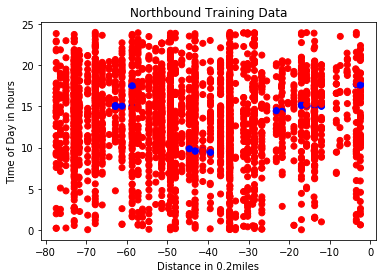

In [8]:
p1 = plt.scatter(nbXtrain[:,4], nbXtrain[:,1], c=colorPoint(nbytrain))
plt.title("Northbound Training Data")
plt.xlabel('Distance in 0.2miles')
plt.ylabel('Time of Day in hours')

Text(0, 0.5, 'Time of Day in hours')

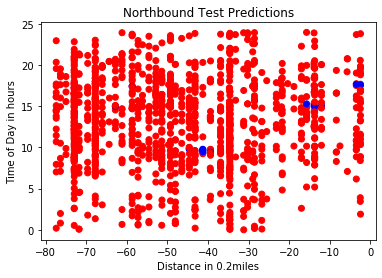

In [34]:
p2 = plt.scatter(nbXtest[:,4], nbXtest[:,1], c=colorPoint(npred))
plt.title("Northbound Test Predictions")
plt.xlabel('Distance in 0.2miles')
plt.ylabel('Time of Day in hours')

Text(0, 0.5, 'Time of Day in hours')

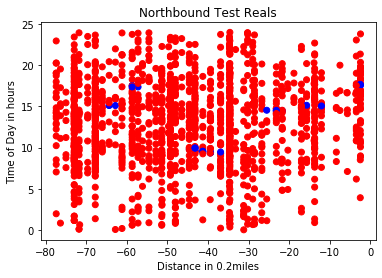

In [10]:
p3 = plt.scatter(nbXtest[:,4], nbXtest[:,1], c=colorPoint(nbytest))
plt.title("Northbound Test Reals")
plt.xlabel('Distance in 0.2miles')
plt.ylabel('Time of Day in hours')

Text(0, 0.5, 'Time of Day in hours')

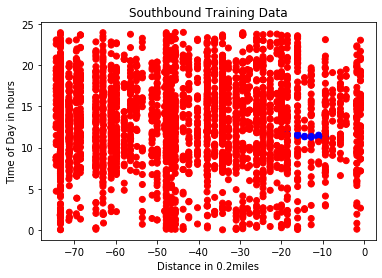

In [11]:
p1 = plt.scatter(sbXtrain[:,4], sbXtrain[:,1], c=colorPoint(sbytrain))
plt.title("Southbound Training Data")
plt.xlabel('Distance in 0.2miles')
plt.ylabel('Time of Day in hours')

Text(0, 0.5, 'Time of Day in hours')

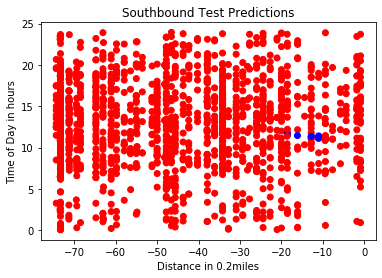

In [12]:
p2 = plt.scatter(sbXtest[:,4], sbXtest[:,1], c=colorPoint(spred))
plt.title("Southbound Test Predictions")
plt.xlabel('Distance in 0.2miles')
plt.ylabel('Time of Day in hours')

Text(0, 0.5, 'Time of Day in hours')

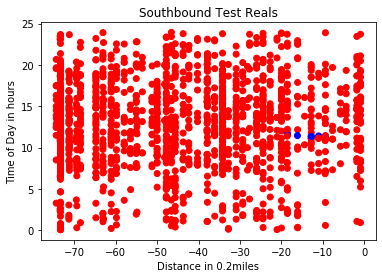

In [13]:
p3 = plt.scatter(sbXtest[:,4], sbXtest[:,1], c=colorPoint(sbytest))
plt.title("Southbound Test Reals")
plt.xlabel('Distance in 0.2miles')
plt.ylabel('Time of Day in hours')

## Visualizing The Model

To understand the function of the model better, we will plot a single decision tree. The models were trained using 100 of these trees. When a single data point is tested by the model, it follows the branches down the tree according to its characteristics. Then after receiving a classification from all 100 trees, it uses the average classification to determine the prediction.

In [14]:
# Extract single tree
estimator = nclf.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
featureList = ["Time", "Day Time", "Latitude", "Longitude", "Distance", "Weekday", "Stopped", "Slow", "Congestion", "Wrong-Way", "Active", "Shoulder","Ramp"],
classList = ["non-accident", "accident"]
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = featureList[0],
                class_names = classList,
                rounded = True, proportion = False, 
                precision = 1, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')


We will also compare which features were most optimal in sepearating cases. The value represents the proportion of splits that correspond to that feature.

In [35]:
print("Northbound")
for i in range(13):
    print("{} importance: \t {}".format(featureList[0][i], nclf.feature_importances_[i]))

Northbound
Time importance: 	 0.2548822615461374
Day Time importance: 	 0.18001565158476893
Latitude importance: 	 0.10544400036065656
Longitude importance: 	 0.11644687959532356
Distance importance: 	 0.10250398947525993
Weekday importance: 	 0.09269058372181922
Stopped importance: 	 0.05293174587930642
Slow importance: 	 0.02787764033123719
Congestion importance: 	 0.019996141753283694
Wrong-Way importance: 	 0.0
Active importance: 	 0.028754784042883726
Shoulder importance: 	 0.014327163108319399
Ramp importance: 	 0.004129158601004096


In [37]:
print("Southbound")
for i in range(13):
    print("{} importance: \t {}".format(featureList[0][i], sclf.feature_importances_[i]))

Southbound
Time importance: 	 0.233758487743069
Day Time importance: 	 0.17300015361648183
Latitude importance: 	 0.09072759806091579
Longitude importance: 	 0.10864188983734654
Distance importance: 	 0.10472743915679593
Weekday importance: 	 0.08220690814829879
Stopped importance: 	 0.04446498936419247
Slow importance: 	 0.0051450109357270785
Congestion importance: 	 0.07228741643646883
Wrong-Way importance: 	 0.0
Active importance: 	 0.05720970077173965
Shoulder importance: 	 0.025935713664981132
Ramp importance: 	 0.0018946922639828437


Suppose New Data was added to the data set, we partitioned the initial data into multiple sets, there are 100 data points which have not been used for training or testing, yet now we have a confidence interval for the power of the model. Typically the model will only add a small number of data points at a time, as it takes only seconds to compute an estimate. After ground truth data is collected about the incident (standard incident reporting methods), the model only takes seconds to train. 

Here we will add new data, test and make predictions:


Model prediction time = 0.20867300033569336 seconds


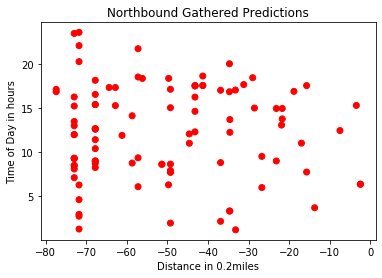

In [26]:
t1 = time.time()
npred = nclf.predict(nblX)
t2 = time.time()
plt.scatter(nblX[:,4], nblX[:,1], c=colorPoint(npred))
plt.title("Northbound Gathered Predictions")
plt.xlabel('Distance in 0.2miles')
plt.ylabel('Time of Day in hours')

print("Model prediction time = {} seconds".format(t2-t1))

Suppose officials verify the ground truth data about the identified cases and this data is submited. We can now train the model to make future predictions with better accuracy:


In [58]:
t1 = time.time()
nclf.fit(np.r_[nbX, nblX], np.r_[nby, nbly])
t2 = time.time()
print("Model retrain time = {} seconds".format(t2-t1))

Model retrain time = 0.9427859783172607 seconds


## Determining Parameters

After testing we found that there was little to no increase in model accuracy, with a linear increase in time. Typically more features increases the accuracy of the model, to test this we plotted an elbow curve, a curve with points: (parameter,error).


In [52]:
import time
nTArray = np.empty(10)
sTArray = np.empty(10)
nRMSEArray = np.empty(10)
sRMSEArray = np.empty(10)
nPostArray = np.empty((10,2,2))
sPostArray = np.empty((10,2,2))
for i in range(10):
    #reformat data
    np.random.shuffle(northData)
    np.random.shuffle(southData)
    nbZ = northData
    sbZ = southData
    #northbound classifier
    nbX, nby = nbZ[:, :13], nbZ[:,13]
    t1 = time.time()
    nN, nD = nbX.shape
    nbXtrain, nbXtest, nbytrain, nbytest = train_test_split(nbX, nby, test_size=0.33, random_state=1)  
    nclf = RandomForestClassifier(n_jobs=2, n_estimators=50*(i+1),random_state=0)
    nclf.fit(nbXtrain, nbytrain)
    npred = nclf.predict(nbXtest)
    t2 = time.time()
    nTArray[i] = t2 - t1
#     nRMSEArray[i] = rmse(npred, nbytest)
    nRMSEArray[i] = rmse(npred, nbytest)
    nPostArray[i] = posterior(npred, nbytest)
    #southbound classifier
    sbX, sby = sbZ[:, :13], sbZ[:,13]
    t1 = time.time()
    sN, sD = sbX.shape
    sbXtrain, sbXtest, sbytrain, sbytest = train_test_split(sbX, sby, test_size=0.33, random_state=1)  
    sclf = RandomForestClassifier(n_jobs=2, n_estimators=50*(i+1),random_state=0)
    sclf.fit(sbXtrain, sbytrain)
    spred= sclf.predict(sbXtest)
    t2 = time.time()
    sTArray[i] = t2 - t1
    sRMSEArray[i] = rmse(spred, sbytest)
    sPostArray[i] = posterior(spred, sbytest)
print("finished gathereing variable number of estimators results")

finished gathereing variable number of estimators results


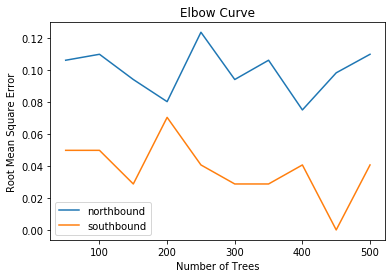

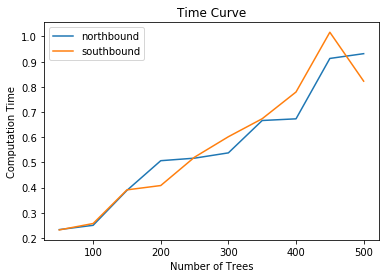

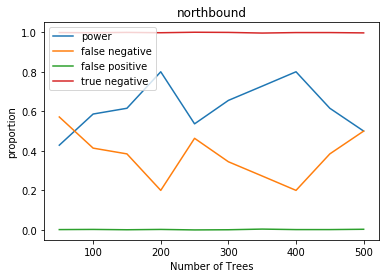

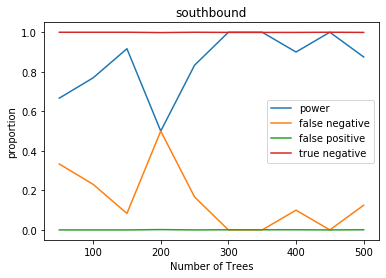

In [59]:
plt.plot(50 * (1 + np.arange(10)), nRMSEArray)
plt.plot(50 * (1 + np.arange(10)), sRMSEArray)
plt.legend(["northbound","southbound"])
plt.xlabel("Number of Trees")
plt.ylabel("Root Mean Square Error")
plt.title("Elbow Curve")
plt.show()


plt.plot(50 * (1 + np.arange(10)), nTArray)
plt.plot(50 * (1 + np.arange(10)), sTArray)
plt.xlabel("Number of Trees")
plt.legend(["northbound","southbound"])
plt.ylabel("Computation Time")
plt.title("Time Curve")
plt.show()


for i in range(4):
    plt.plot(50 * (1 + np.arange(10)), nPostArray[:,i//2, i%2])
plt.xlabel("Number of Trees")
plt.ylabel("proportion")
plt.legend(["power", "false negative", "false positive", "true negative"])
plt.title("northbound")
plt.show()

for i in range(4):
    plt.plot(50 * (1 + np.arange(10)), sPostArray[:,i//2, i%2])
plt.xlabel("Number of Trees")
plt.ylabel("proportion")
plt.legend(["power", "false negative", "false positive", "true negative"])
plt.title("southbound")
plt.show()

We can change the class weight to reduced the rate of true negative, and increase the power. For the application of this model, it can show accidents with some confidence, yet show non-accidents with much more confidence. If we changed the class weight to have more assurance in accident cases we risk errors in which tow-trucks and services are mobilized to find no accident there. If we fail to report an accident (occuring roughly 15% of the accidents), the tow trucks and serivces are not mobilized for until the accident is reported by standard methods, a few minutes later. The model as it sits currently prevents unnecessary expenditure for incident services, while providing earlier access to incident classification.